# Python Programming, Visualization and Text Analysis - Project
- Ghazal Ayobi

## Overview
The purpose of this project is to use reviews data and evaluate the sentiment using three different methods. For this purpose I will use Amazon cell phones reviews datasets. The link can be found [here](https://www.kaggle.com/datasets/grikomsn/amazon-cell-phones-reviews). To measure sentiment of the reviews text, first I will evaluate reviews based on the rating score, this method is a preliminary step to understand the relationship between the text and rating. The second method is text blob sentiment analysis methods, and the third method I will be using is Vader sentiment analysis. The project is divided in the following steps. First, I will perform explanatory data analysis, EDA, second I will clean the reviews text, third I will perform sentiment analysis, fourth I will use Naive Bayes Classifier to evaluate the result and then I divide the dataset into train and test sets and finally I will answer the question that which sentiment analysis gives overall a better result in terms of accuracy. The structure of this project is as following:
- Data cleaning and EDA
- Text-preprocessing
- Data visualization
- Algorithms 
- Findings and conclusion

In [1]:
# Loading packages
import pandas as pd
import sys
import os
import nltk
from wordcloud import WordCloud
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import numpy as np
import re
import random
import matplotlib.pyplot as plt
#!pip install squarify
import squarify 

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer


sentiment = SentimentIntensityAnalyzer()

import contractions
from langdetect import detect


from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import wordnet

from collections import Counter
from itertools import chain


import datetime
import string

import plotly.figure_factory as ff

## Task 1: Reading and Inspection

-  ### Subtask 1.1: Import and read

In this section I will import and read the data. In order for easy access, I have uploaded the data on my GitHub account. The link for the GitHub repository can be found [here](https://github.com/ghazalayobi/Python-Programming-Visualization-and-Text-Analysis). Amazon cell phones data set has two data tables which are `item` and `reviews`. The items data table contains the detailed description of each phone and the reviews table contains information and all reviews for each phone.

In [2]:
# reading the data from github

item = pd.read_csv("https://raw.githubusercontent.com/ghazalayobi/Python-Programming-Visualization-and-Text-Analysis/main/data/items.csv")
review = pd.read_csv("https://raw.githubusercontent.com/ghazalayobi/Python-Programming-Visualization-and-Text-Analysis/main/data/reviews.csv")

In [3]:
# checking the items data table
item.head(4)

,asin,brand,title,url,image,rating,reviewUrl,totalReviews,price,originalPrice
0,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.0
1,B0009N5L7K,Motorola,Motorola I265 phone,https://www.amazon.com/Motorola-i265-I265-phon...,https://m.media-amazon.com/images/I/419WBAVDAR...,3.0,https://www.amazon.com/product-reviews/B0009N5L7K,7,49.95,0.0
2,B000SKTZ0S,Motorola,MOTOROLA C168i AT&T CINGULAR PREPAID GOPHONE C...,https://www.amazon.com/MOTOROLA-C168i-CINGULAR...,https://m.media-amazon.com/images/I/71b+q3ydkI...,2.7,https://www.amazon.com/product-reviews/B000SKTZ0S,22,99.99,0.0
3,B001AO4OUC,Motorola,Motorola i335 Cell Phone Boost Mobile,https://www.amazon.com/Motorola-i335-Phone-Boo...,https://m.media-amazon.com/images/I/710UO8gdT+...,3.3,https://www.amazon.com/product-reviews/B001AO4OUC,21,0.00,0.0


In [4]:
# checking reviews 
review.head(4)

,asin,name,rating,date,verified,title,body
0,B0000SX2UC,Janet,3,11-Oct-05,False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...
1,B0000SX2UC,Luke Wyatt,1,7-Jan-04,False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...
2,B0000SX2UC,Brooke,5,30-Dec-03,False,Love This Phone,"This is a great, reliable phone. I also purcha..."
3,B0000SX2UC,amy m. teague,3,18-Mar-04,False,"Love the Phone, BUT...!","I love the phone and all, because I really did..."


In [5]:
# items descriptive statistics 
item.describe().T

,count,mean,std,min,25%,50%,75%,max
rating,720.0,3.713750,0.716014,1.0,3.3000,3.800,4.100,5.00
totalReviews,720.0,105.679167,167.601101,1.0,7.0000,32.000,122.250,983.00
price,720.0,234.948931,200.008441,0.0,97.5125,188.975,336.725,999.99
originalPrice,720.0,63.690778,172.405370,0.0,0.0000,0.000,0.000,999.99


In [6]:
# reviews descriptive statistics 
review.describe().T

,count,mean,std,min,25%,50%,75%,max
rating,67986.0,3.807916,1.582906,1.0,3.0,5.0,5.0,5.0


The `Item` dataset contains a unique brand id, brand name, title, URL, review URL, total reviews, price, and original price. `review` dataset contains a unique brand id, name of customer, rating, review date, customer verification status, the title of review and reviews. In the list of items dataset, there are a few column which are not required for the pupose of this analysis, thus, I will drop them to prepare the data for analysis. 

In [7]:
# drop columns
item.drop(['url', 'image', 'reviewUrl', 'originalPrice'], axis=1, inplace=True)
review.drop('name', axis=1, inplace=True)

In the following code, I would like to merge the items and reviews data sets based on the unique id `asin` brand and price

In [8]:
df = pd.merge(review, item[['asin', 'brand', 'price']], on = "asin", how = 'left')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67986 entries, 0 to 67985
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   asin      67986 non-null  object 
 1   rating    67986 non-null  int64  
 2   date      67986 non-null  object 
 3   verified  67986 non-null  bool   
 4   title     67972 non-null  object 
 5   body      67965 non-null  object 
 6   brand     67786 non-null  object 
 7   price     67986 non-null  float64
dtypes: bool(1), float64(1), int64(1), object(5)
memory usage: 4.2+ MB


The new combined data frame contains 67986 observations and 8 columns. `asin` represents the unique code for each phone, `rating` is customers rating score, `date` is the date of review added, `verified` is status of customer account. `title` is the title of the review. `body` is the text of the review, `brand` is information about brand of the phone and `price` is the amount of phone cell phone price.

As this is a really big set and contains long computational time. For purpose of faster analysis, I have provided the following sampling code to select a smaller sample. 

In [10]:
random.seed(123)
#df = df.sample(n = 50000)

In [11]:
# Deleting the dataframes to save space
del item
del review

## Task 2: Explanatory Data Analysis

In this section I check the distribution of main variables and explore the data. The information of `df` shows that columns such as date has object type which has to be changed to the date format. 

The below chart shows that smasung has the highest number of reviews

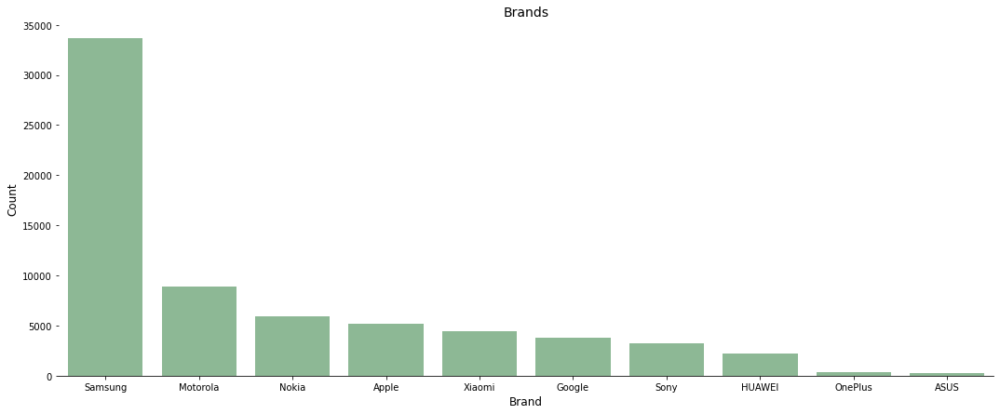

In [12]:
# visualizing Brands and their reviews

plt.subplots(figsize=(18,7))
x = sns.countplot(x='brand', data=df, color = '#86bf91', order = df['brand'].value_counts().index)
plt.ylabel("Count", size=12)
plt.xlabel("Brand", size=12)
plt.title("Brands", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)

The below chart shows that Samsung and apple has the highest price variation.

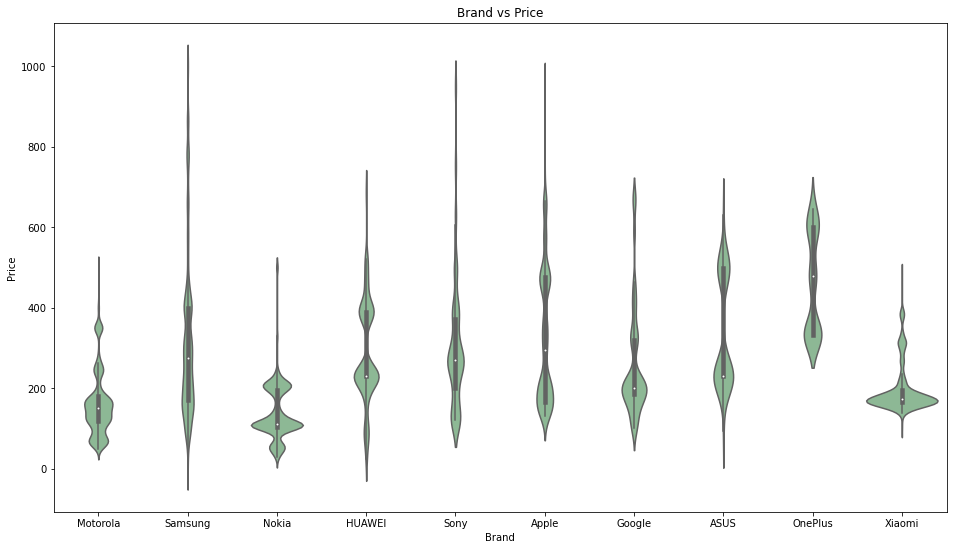

In [13]:
# violon plot to show distribution of price of each brand
plt.rcParams.update({'font.size': 10})
mpl.rcParams['figure.figsize'] = 16,9
# Creating dataframe and removing 0 helpfulrate records
senti_help= pd.DataFrame(df, columns = ['brand', 'price'])
senti_help = senti_help[senti_help['price'] != 0.00] 

#Plotting phase
sns.violinplot( x=senti_help["brand"], y=senti_help["price"], color = '#86bf91')
plt.title('Brand vs Price')
plt.xlabel('Brand')
plt.ylabel('Price')
plt.show()

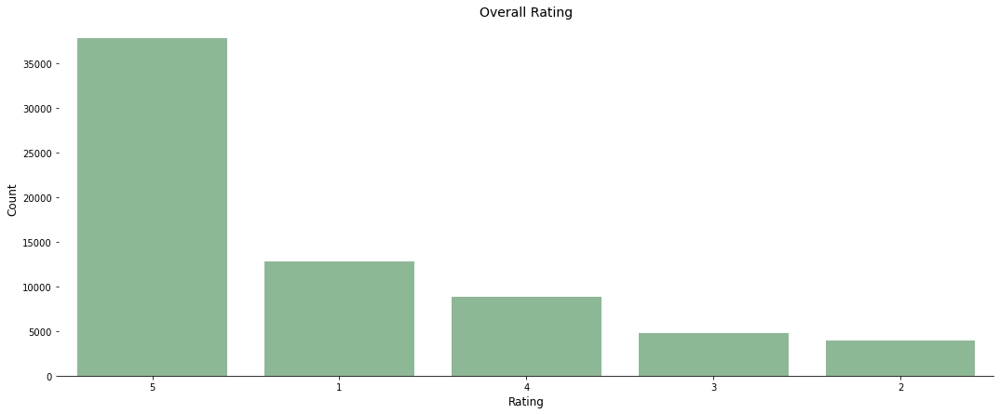

In [14]:
# Visualizing rating, the order of the column is based on the frequnecy of the rating

plt.subplots(figsize=(18,7))
x = sns.countplot(x='rating', data=df, color = '#86bf91', order = df['rating'].value_counts().index)
plt.ylabel("Count", size=12)
plt.xlabel("Rating", size=12)
plt.title("Overall Rating", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)

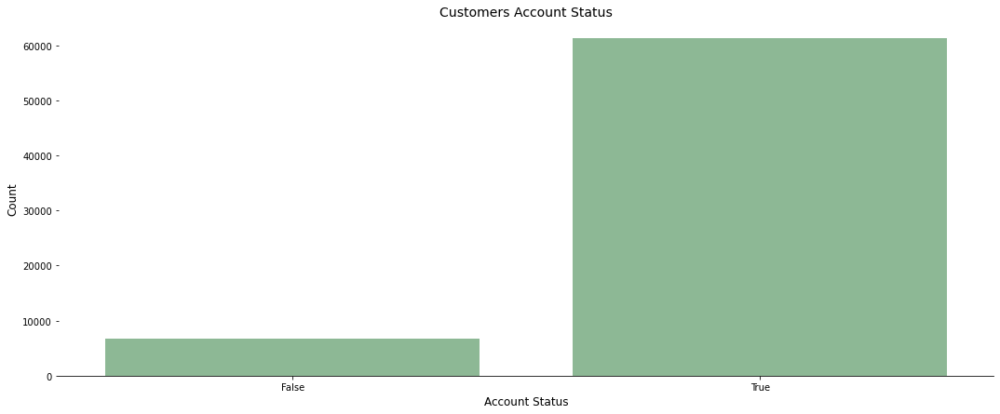

In [15]:
# Visualizing cutomer's account status which is either verified or otherwise

plt.subplots(figsize=(18,7))
x = sns.countplot(x='verified', data=df, color = '#86bf91')
plt.ylabel("Count", size=12)
plt.xlabel("Account Status", size=12)
plt.title("Customers Account Status", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)

The below graph shows the overall price distribution of the phones, it can be seen that the chart has right long tail. 

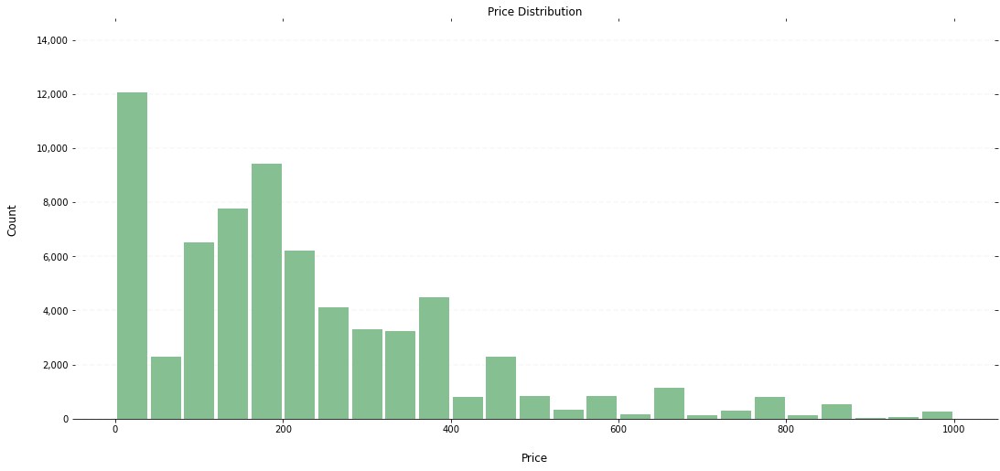

In [16]:
# looking at the price distrubtion 
ax = df.hist(column='price', bins=25, grid=False, figsize=(18,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Price Distribution")

    # Set x-axis label
    x.set_xlabel("Price", labelpad=20, size=12)

    # Set y-axis label
    x.set_ylabel("Count", labelpad=20, size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,g}'))

We have seen that the date column is stored as object. In the below chunk of code, I have transformed the mentioned column to date and created new columns for month, and weekday 

In [17]:
# cleaning date column
# changing the date formate

df['date_clean'] = pd.to_datetime(df['date'],format='%d-%b-%y')

# tranforming the data column to new individual columns
df["year"] = df["date_clean"].dt.year 
df["month"] = df["date_clean"].dt.strftime("%b")
df["weekday"] = df["date_clean"].dt.day_name()

The below chart shows the total number of reviews per year. It can be seen that that number of reviews significantly increased over the years.

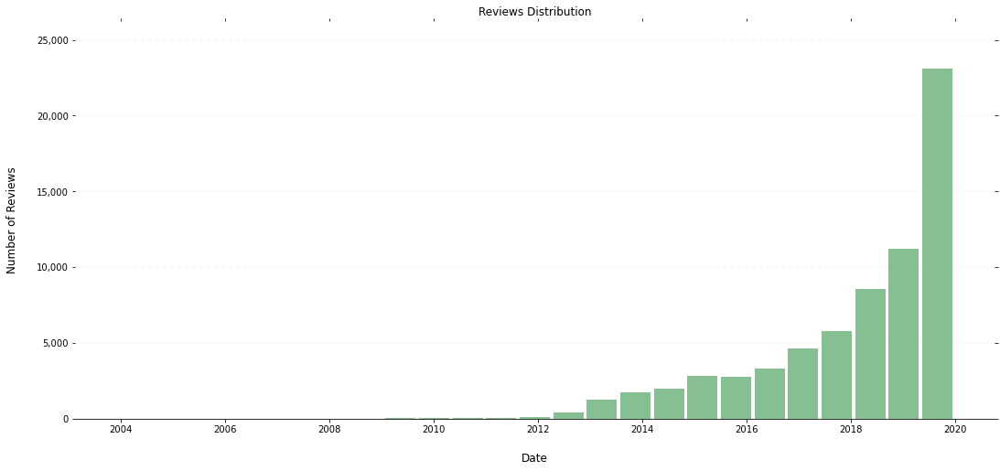

In [18]:
# looking at the reviews distrubtion per year
ax = df.hist(column='date_clean', bins=25, grid=False, figsize=(18,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Reviews Distribution")

    # Set x-axis label
    x.set_xlabel("Date", labelpad=20, size=12)

    # Set y-axis label
    x.set_ylabel("Number of Reviews", labelpad=20, size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,g}'))

The below chart show the number of reviews per month, it is interesting to see that we have the highest number of reviews in the December. It can be said from behavior of buyers that there are many purchases before and during December. On the other hand the number of reviews is the lowest January, February and April.

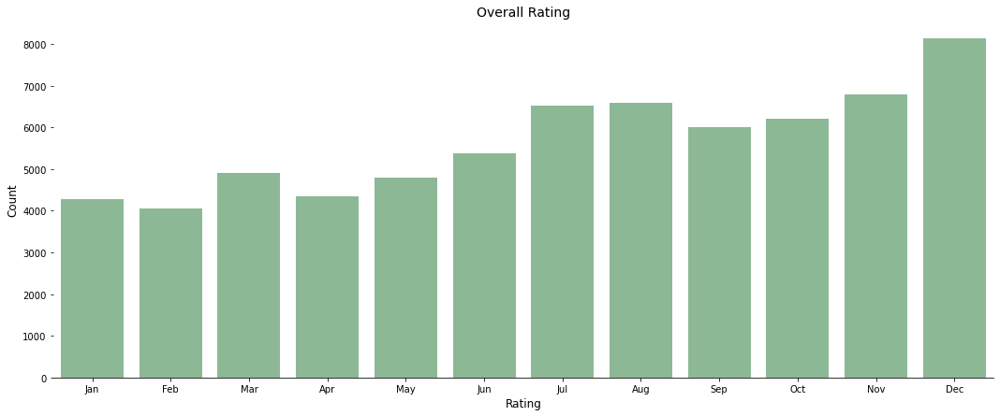

In [19]:
# Visualizing rating, the order of the column is based on the frequnecy of the rating
Months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.subplots(figsize=(18,7))
x = sns.countplot(x='month', data=df, color='#86bf91', order = Months)
plt.ylabel("Count", size=12)
plt.xlabel("Rating", size=12)
plt.title("Overall Rating", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)


Another interesting pattern can be drawn from the data set by looking at the number of reviews per day of the week. It can seen that there are many reviews on mondays

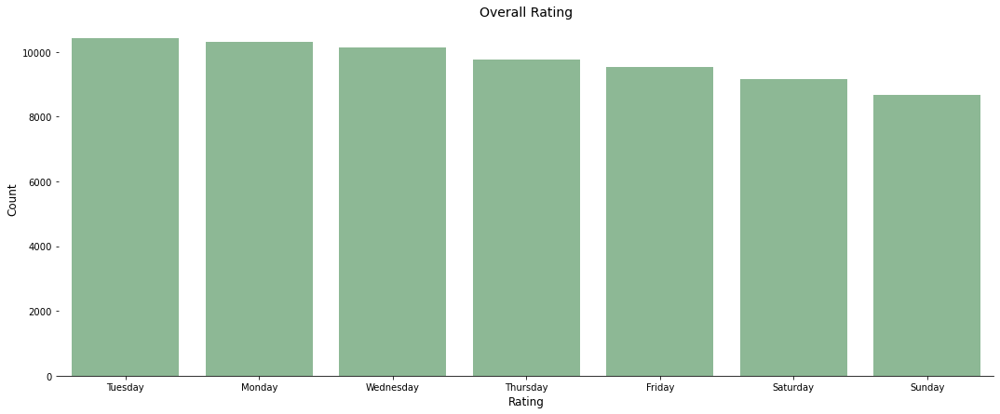

In [20]:
# Visualizing rating, the order of the column is based on the frequnecy of the rating

plt.subplots(figsize=(18,7))
x = sns.countplot(x='weekday', data=df, color='#86bf91', order = df['weekday'].value_counts().index)
plt.ylabel("Count", size=12)
plt.xlabel("Rating", size=12)
plt.title("Overall Rating", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)

Review rating provides an overall idea of the reviews, however it is not part of the text analysis. It is considered as a preliminary step to understand about the data. Thus, I have created a rating sentiment column. The values for this column are Positive, Negative and Neutral. It is positive when rating is three and four, neutral when rating is 3 and negative when rating is 1 or 2.

In [21]:
def f_rating(row):
    
#This function returns sentiment value based on the overall ratings from the user
    
    if row['rating'] == 3.0:
        val = 'Neutral'
    elif row['rating'] == 1.0 or row['rating'] == 2.0:
        val = 'Negative'
    else:
        val = 'Positive'
    return val

In [22]:
#Applying the function in our new column
df['rating_sentiment'] = df.apply(f_rating, axis=1)
df.head()

,asin,rating,date,verified,title,body,brand,price,date_clean,year,month,weekday,rating_sentiment
0,B0000SX2UC,3,11-Oct-05,False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,NaN,0.0,2005-10-11,2005,Oct,Tuesday,Neutral
1,B0000SX2UC,1,7-Jan-04,False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,NaN,0.0,2004-01-07,2004,Jan,Wednesday,Negative
2,B0000SX2UC,5,30-Dec-03,False,Love This Phone,"This is a great, reliable phone. I also purcha...",NaN,0.0,2003-12-30,2003,Dec,Tuesday,Positive
3,B0000SX2UC,3,18-Mar-04,False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",NaN,0.0,2004-03-18,2004,Mar,Thursday,Neutral
4,B0000SX2UC,4,28-Aug-05,False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,NaN,0.0,2005-08-28,2005,Aug,Sunday,Positive


<AxesSubplot:ylabel='rating_sentiment'>

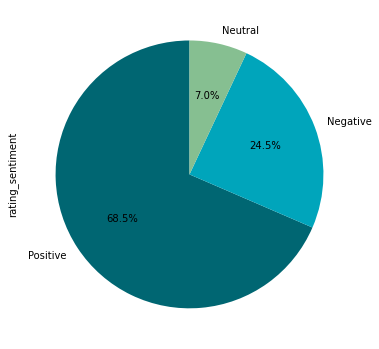

In [23]:
df['rating_sentiment'].value_counts().plot(kind='pie', figsize=(6, 7),
                            autopct='%1.1f%%', # add in percentages
                            startangle=90,
                                   colors = ['#006672', '#00a5bb', '#86bf91', ])

## Task 3: Processing the data
In the section, I will process and clean the text and data. Inspect the dataframe's columns, shapes, variable types and others.

In [24]:
df.shape

(67986, 13)

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67986 entries, 0 to 67985
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   asin              67986 non-null  object        
 1   rating            67986 non-null  int64         
 2   date              67986 non-null  object        
 3   verified          67986 non-null  bool          
 4   title             67972 non-null  object        
 5   body              67965 non-null  object        
 6   brand             67786 non-null  object        
 7   price             67986 non-null  float64       
 8   date_clean        67986 non-null  datetime64[ns]
 9   year              67986 non-null  int64         
 10  month             67986 non-null  object        
 11  weekday           67986 non-null  object        
 12  rating_sentiment  67986 non-null  object        
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2), object(8)
memory usage:

For the purpose of analysis I will be working with review text, it can be seen that reviews have contractions, numbers, emojis and punctuation. Thus, the major part of analysis will be concentrated on the review cleaning

In [26]:
df['body'].head(20)

0     I had the Samsung A600 for awhile which is abs...
1     Due to a software issue between Nokia and Spri...
2     This is a great, reliable phone. I also purcha...
3     I love the phone and all, because I really did...
4     The phone has been great for every purpose it ...
5     Hello, I have this phone and used it until I d...
6     Cool. Cheap. Color: 3 words that describe the ...
7     The 3599i is overall a nice phone, except that...
8     I've never owned a Nokia phone before, so this...
9     ok well im in school and i need the text messa...
10    I've had this phone for over a year and I real...
11    1.) Slow - If you want to check your missed ca...
12    I bought this phone about a year ago and have ...
13    This is an excellent choice for Sprint to use ...
14                             DON'T BUY OUT OF SERVICE
15    I have been with nextel for nearly a year now ...
16    I just got it and have to say its easy to use,...
17    1 star because the phones locked so I have

The main task is to drop duplicates from the data. Thus, in the following section, I will remove the duplicates and find the percentage of missing values in the observations

In [27]:
# removing duplicates rows
df = df.drop_duplicates()

In [28]:
#look for missing data
for col in df.columns:
    percent_missing = df[col].isnull().mean()
    print("{} - {}%".format(col, percent_missing))

asin - 0.0%
rating - 0.0%
date - 0.0%
verified - 0.0%
title - 0.00020604901022886157%
body - 0.0003090735153432924%
brand - 0.002943557288983737%
price - 0.0%
date_clean - 0.0%
year - 0.0%
month - 0.0%
weekday - 0.0%
rating_sentiment - 0.0%


We can see from the missing percentage that title, body and brand has a very small number of missing values. As it is difficult to estimate name of brand and review for a specific observation, thus, I decided to drop the null values.

In [29]:
df = df.dropna(subset=['title', 'body', 'brand'])

We can see there is zero missing values in the data set

In [30]:
# checkimg for missing values
df.isnull().sum(axis=0).sort_values(ascending=False)

asin                0
rating              0
date                0
verified            0
title               0
body                0
brand               0
price               0
date_clean          0
year                0
month               0
weekday             0
rating_sentiment    0
dtype: int64

## Task 4: Text cleaning
##### Cleaning the data, removing the punctuation

The below reviews shows that the text contains emojis, numbers, characters and other elements. The text needs to be cleaned to prepare it for sentiment analysis.  

In [31]:
df['body'].sort_values(ascending=False)

59235                                                  🥰🥰🥰
60393                                                   🥰📸
24635                                               🤝🏾👌🏾🙌🏽
27964                                                    🙂
44942                                                  😻😻😻
                               ...                        
65901    "Thank God, free at last, free at last!! I'm d...
12586    "No Verizon SIM card" message will not go away...
1622     "I purchased this item & got it pretty quickly...
43829    "Excellent Hardware, however poor, annoying, i...
28618    !!!DO NOT BUY!!!I was sold a blackisted phone....
Name: body, Length: 67715, dtype: object

I use the below function to remove punctuations punctuations and lower the text, then I applied the function on the title and body of reviews. Moreover, I also remove contractions and kept only numbers

In [32]:
# function to remove punctuations and lower text
def remove_punc(text):
    text = re.sub(r'[^\w\s]','', text)
    text = text.lower()   
    return text  

In [33]:
# app
df['review'] = df['body'].apply(remove_punc)
df['title'] = df['title'].apply(remove_punc)

In [34]:
# fixing the contractions in both review and title
df['review'] = df['review'].apply(contractions.fix)
df['title'] = df['title'].apply(contractions.fix)

In [35]:
# keeping only letters and spaces
df['review'] = df['review'].str.replace(r'[^a-zA-Z] ', '')
df['title'] = df['title'].str.replace(r'[^a-zA-Z] ', '')

/var/folders/lv/xw7m9vlx11v3vjpfcj901gw80000gn/T/ipykernel_10610/3462853859.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['review'] = df['review'].str.replace(r'[^a-zA-Z] ', '')
/var/folders/lv/xw7m9vlx11v3vjpfcj901gw80000gn/T/ipykernel_10610/3462853859.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  df['title'] = df['title'].str.replace(r'[^a-zA-Z] ', '')


In [36]:
# function to remove emojis
def no_emoji(text):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'',text)

In [37]:
# apply the no emojis function to the reviews and title
df['review'] = df['review'].apply(no_emoji)
df['title'] = df['title'].apply(no_emoji)

In [38]:
# checking the reviews
df['review'].sort_values(ascending=False)

20359                                                  тор
21450                                                ótimo
37701    él teléfono salio bien en la mayoría de las pr...
1491     zune did not recognize my device using similar...
38112                                           zreplacer 
                               ...                        
12619                                                     
19331                                                     
35522                                                     
24877                                                     
49196                                                     
Name: review, Length: 67715, dtype: object

In [39]:
df = df.dropna(subset=['review'])

In the above section I cleaned the titles and reviews, where I removed contractions, punctuations and emojis. Thus, I a result of analysis I drop the observations where review is null

Amazon is really big retailer, and the reviews come from across the world. For the purpose of analysis, I would like to focus on the English language reviews.

In [40]:
# detecting the language 
def lang_detect(text):
    try:
        lang = detect(text)
    except Exception:
        lang = 'NA'
    return lang

In [41]:
# applying the language function
df['lang'] = df['review'].apply(lang_detect)

In [42]:
len(df)

67715

In [43]:
df = df[df['lang']=="en"]

In [44]:
len(df)

58259

#### Section Summary
In this section I cleaned the reviews text where I removed punctuations and emojis. This reason for this is that I will analyze the text in the next section. Text cleaning helps to better detect the sentiment and process the algorithm. Moreover I also used an algorithm to detect the language, As my main focus is understanding the english language reviews. In the next section, I will be processing the text.

## Task 5: Text processing
#### Tokenization

In this section first I am using POS tagging which is a process to mark the words for a particular part of a speech based on its definition and context (Guru99). My main aim of this step is to identify adjectives, verbs nouns and adverbs. Moreover, I removed the stop words from the below section. This helps to understand about the most commons words in the dataset. Moreover, after identifying the main parts of speech, I will use lemmatization. I prefer this algorithm because it gives the base form of the word and keeps the complete words compared to stemming.

In [45]:
# POS tagger dictionary
pos_dict = {'J':wordnet.ADJ, 'V':wordnet.VERB, 'N':wordnet.NOUN, 'R':wordnet.ADV}

def token_stop_pos(text):
    tags = pos_tag(word_tokenize(text))
    newlist = []
    for word, tag in tags:
        if word.lower() not in set(stopwords.words('english')):
            newlist.append(tuple([word, pos_dict.get(tag[0])]))
    return newlist

df['POS tagged'] = df['review'].apply(token_stop_pos)
df.head()

,asin,rating,date,verified,title,body,brand,price,date_clean,year,month,weekday,rating_sentiment,review,lang,POS tagged
14,B0009N5L7K,1,5-Mar-16,True,stupid phone,DON'T BUY OUT OF SERVICE,Motorola,49.95,2016-03-05,2016,Mar,Saturday,Negative,do not buy out of service,en,"[(buy, v), (service, n)]"
15,B0009N5L7K,4,9-Feb-06,False,exellent service,I have been with nextel for nearly a year now ...,Motorola,49.95,2006-02-09,2006,Feb,Thursday,Positive,i have been with nextel for nearly a year now ...,en,"[(nextel, n), (nearly, r), (year, n), (started..."
16,B0009N5L7K,5,7-Feb-06,False,i love it,"I just got it and have to say its easy to use,...",Motorola,49.95,2006-02-07,2006,Feb,Tuesday,Positive,i just got it and have to say its easy to use ...,en,"[(got, v), (say, v), (easy, a), (use, v), (hea..."
17,B0009N5L7K,1,20-Dec-16,True,phones locked,1 star because the phones locked so I have to ...,Motorola,49.95,2016-12-20,2016,Dec,Tuesday,Negative,star because the phones locked so i have to pa...,en,"[(star, n), (phones, n), (locked, v), (pay, v)..."
18,B0009N5L7K,5,13-Dec-09,True,excellent product,The product has been very good. I had used thi...,Motorola,49.95,2009-12-13,2009,Dec,Sunday,Positive,the product has been very good i had used this...,en,"[(product, n), (good, a), (used, v), (cell, n)..."


In [46]:
# creating a function to lemmatize the words
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

def lemmatize(pos_data):
    lemma_rew = " "
    for word, pos in pos_data:
        if not pos:
            lemma = word
            lemma_rew = lemma_rew + " " + lemma
        else:
            lemma = wordnet_lemmatizer.lemmatize(word, pos=pos)
            lemma_rew = lemma_rew + " " + lemma
    return lemma_rew

df['lemma'] = df['POS tagged'].apply(lemmatize)

In the below chunk of codes I will visualize the 10 most common words in the dataset and in the three sentiments based on the rating. As I previously given positive sentiment where rating is 4 or 5, Neutral if rating is 3 and negative if the rating 1 or 2. It is interesting to see that in the dataset the most common words are use, work, get and great. It is clearly seen that the most common word in the positive sentiment is great. On the contrary the most common words in negative reviews are work, get, and use indicating technical issues. 

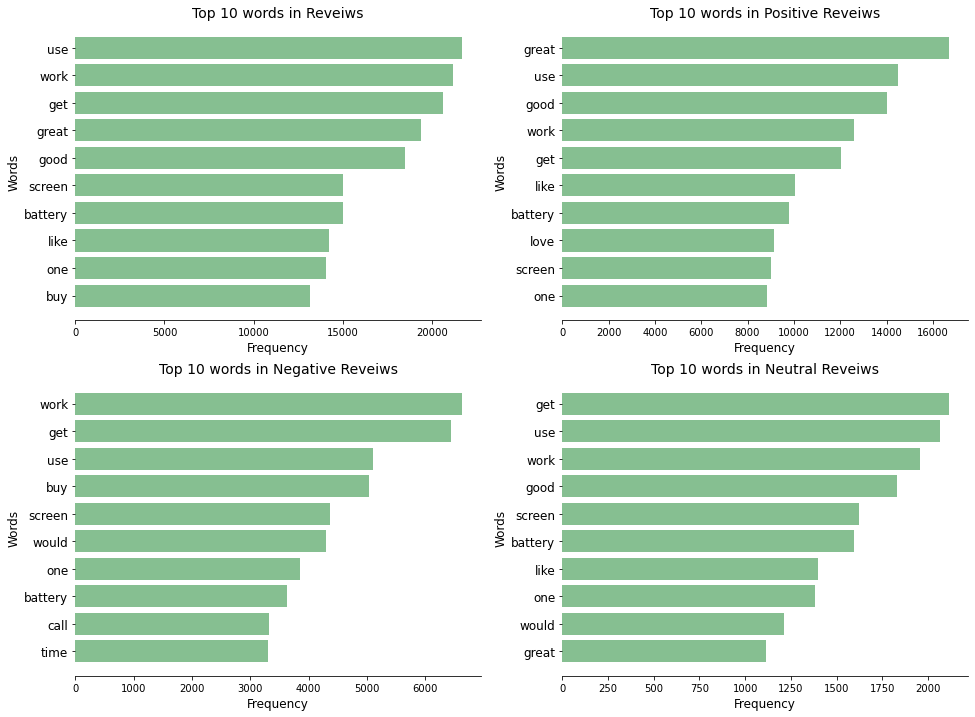

In [47]:
# Visualizing the most 10 common words 
fig, ax = plt.subplots(2, 2, figsize=(16,12))

# top most common words in all reviews
words = [x.split() for x in df.lemma.values]
cx = Counter(list(chain(*words)))
top = 10
most_common = cx.most_common()[1:]
x, y = zip(*most_common[:top])
ax[0,0].barh(range(len(x)), y, color ='#86bf91')
ax[0,0].invert_yaxis()
ax[0,0].set_xlabel('Frequency', fontsize=12)
ax[0,0].set_ylabel('Words' , fontsize=12)
ax[0,0].set_yticks(np.arange(len(x)))
ax[0,0].set_yticklabels(x, fontsize=12)
ax[0,0].set_title('Top 10 words in Reveiws', fontsize=14)
ax[0,0].spines['right'].set_visible(False)
ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['left'].set_visible(False)

words = [x.split() for x in df[(df.rating_sentiment=='Positive')].lemma.values]
cx = Counter(list(chain(*words)))
top = 10
most_common = cx.most_common()[1:]
x, y = zip(*most_common[:top])
ax[0,1].barh(range(len(x)), y, color = '#86bf91')
ax[0,1].invert_yaxis()
ax[0,1].set_xlabel('Frequency', fontsize=12)
ax[0,1].set_ylabel('Words' , fontsize=12)
ax[0,1].set_yticks(np.arange(len(x)))
ax[0,1].set_yticklabels(x, fontsize=12)
ax[0,1].set_title('Top 10 words in Positive Reveiws', fontsize=14)
ax[0,1].spines['right'].set_visible(False)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['left'].set_visible(False)


words = [x.split() for x in df[(df.rating_sentiment=='Negative')].lemma.values]
cx = Counter(list(chain(*words)))
top = 10
most_common = cx.most_common()[1:]
x, y = zip(*most_common[:top])
ax[1,0].barh(range(len(x)), y, color = '#86bf91')
ax[1,0].invert_yaxis()
ax[1,0].set_xlabel('Frequency', fontsize=12)
ax[1,0].set_ylabel('Words' , fontsize=12)
ax[1,0].set_yticks(np.arange(len(x)))
ax[1,0].set_yticklabels(x, fontsize=12)
ax[1,0].set_title('Top 10 words in Negative Reveiws', fontsize=14)
ax[1,0].spines['right'].set_visible(False)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['left'].set_visible(False)


words = [x.split() for x in df[(df.rating_sentiment=='Neutral')].lemma.values]
cx = Counter(list(chain(*words)))
top = 10
most_common = cx.most_common()[1:]
x, y = zip(*most_common[:top])
ax[1, 1].barh(range(len(x)), y, color = '#86bf91' )
ax[1, 1].invert_yaxis()
ax[1, 1].set_xlabel('Frequency', fontsize=12)
ax[1, 1].set_ylabel('Words' , fontsize=12)
ax[1, 1].set_yticks(np.arange(len(x)))
ax[1, 1].set_yticklabels(x, fontsize=12)
ax[1,1].set_title('Top 10 words in Neutral Reveiws', fontsize=14)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['left'].set_visible(False)

plt.show()

The below graph shows that based on the rating sentiment analysis, all the brands have the highest positive sentiment. It is worth mentioning that samsung has the highest number of reviews 

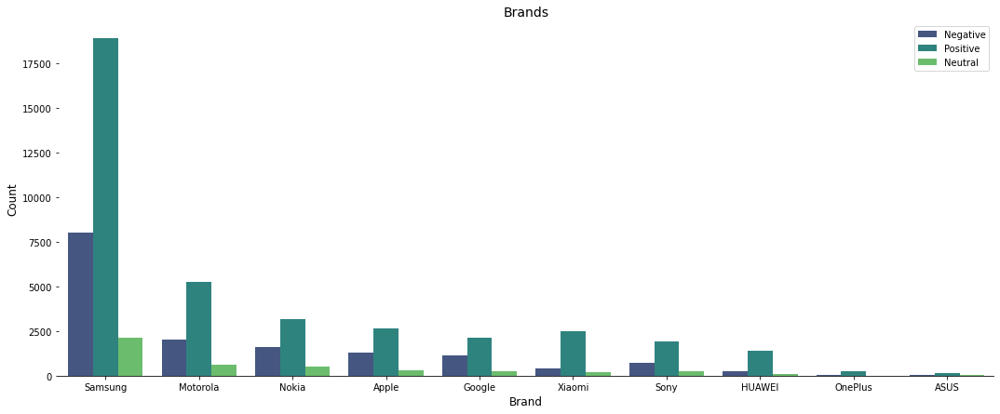

In [48]:

plt.subplots(figsize=(18,7))
x = sns.countplot(x='brand', data=df, hue = 'rating_sentiment', palette="viridis", order = df['brand'].value_counts().index)
plt.legend(loc='upper right')
plt.ylabel("Count", size=12)
plt.xlabel("Brand", size=12)
plt.title("Brands", size=14)
x.spines['right'].set_visible(False)
x.spines['top'].set_visible(False)
x.spines['left'].set_visible(False)

## Task 5: Text Analysis

- ### Sentiment Analysis

In this section I will be evaluating two different types of sentiment analysis. The first is text blob and the second is Vader sentiment analysis. The result from both sentiment analysis will be evaluated by the Naive bayes classifier. As a result of Naive bayes classifier, I will choose one methods to divide the data into test and train sets and calculate the confusion matrix. The goal of this project of to evaluate the reviews sentiment with the score rating sentiment.

- ### Subtask 5.1 Sentiment Analysis using TextBlob

In the following section I use text blob sentiment analysis method. In the following code chunk I add three functions to get the result from text blob polarity score. Text blob polarity score is between -1, and 1. For the purpose of sentiment analysis I use lemmatized text where stop words are removed and it is a unigram words. The purpose of using unigram is to evaluate main single words which are commonly used in the reviews.

In [49]:
# creating functions to get the polarity score
from textblob import TextBlob
# function to calculate subjectivity
def getSubjectivity(review):
    return TextBlob(review).sentiment.subjectivity
    # function to calculate polarity

def getPolarity(review):
        return TextBlob(review).sentiment.polarity

# function to analyze the reviews
def analysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

In [50]:
# applying the get polarity score to the lemmatized words
df['Polarity'] = df['lemma'].apply(getPolarity) 
df['Analysis'] = df['Polarity'].apply(analysis)

df.head(3)

,asin,rating,date,verified,title,body,brand,price,date_clean,year,month,weekday,rating_sentiment,review,lang,POS tagged,lemma,Polarity,Analysis
14,B0009N5L7K,1,5-Mar-16,True,stupid phone,DON'T BUY OUT OF SERVICE,Motorola,49.95,2016-03-05,2016,Mar,Saturday,Negative,do not buy out of service,en,"[(buy, v), (service, n)]",buy service,0.000,Neutral
15,B0009N5L7K,4,9-Feb-06,False,exellent service,I have been with nextel for nearly a year now ...,Motorola,49.95,2006-02-09,2006,Feb,Thursday,Positive,i have been with nextel for nearly a year now ...,en,"[(nextel, n), (nearly, r), (year, n), (started...",nextel nearly year start time last year moto...,0.620,Positive
16,B0009N5L7K,5,7-Feb-06,False,i love it,"I just got it and have to say its easy to use,...",Motorola,49.95,2006-02-07,2006,Feb,Tuesday,Positive,i just got it and have to say its easy to use ...,en,"[(got, v), (say, v), (easy, a), (use, v), (hea...",get say easy use hear person talk fine probl...,0.425,Positive


- ### Subtask 5.2 Sentiment Analysis using Vader

In the following section I use Vader sentiment analysis method to evaluate reviews. For this purpose I use lemmatized words. The below code chunks I created two functions to find compound score of Vader and identify the positive, negative and neutral reviews

In [51]:

# function to calculate vader sentiment
analyzer = SentimentIntensityAnalyzer()
def vadersentimentanalysis(review):
    vs = analyzer.polarity_scores(review)
    return vs['compound']
    
    # function to analyse
def vader_analysis(compound):
    if compound >= 0.5:
        return 'Positive'
    elif compound <= -0.5 :
        return 'Negative'
    else:
        return 'Neutral'

In [52]:
# applying the vader sentiment functions
df['Vader Sentiment'] = df['lemma'].apply(vadersentimentanalysis)
df['Vader_Analysis'] = df['Vader Sentiment'].apply(vader_analysis)

df.head(3)

,asin,rating,date,verified,title,body,brand,price,date_clean,year,...,weekday,rating_sentiment,review,lang,POS tagged,lemma,Polarity,Analysis,Vader Sentiment,Vader_Analysis
14,B0009N5L7K,1,5-Mar-16,True,stupid phone,DON'T BUY OUT OF SERVICE,Motorola,49.95,2016-03-05,2016,...,Saturday,Negative,do not buy out of service,en,"[(buy, v), (service, n)]",buy service,0.000,Neutral,0.0000,Neutral
15,B0009N5L7K,4,9-Feb-06,False,exellent service,I have been with nextel for nearly a year now ...,Motorola,49.95,2006-02-09,2006,...,Thursday,Positive,i have been with nextel for nearly a year now ...,en,"[(nextel, n), (nearly, r), (year, n), (started...",nextel nearly year start time last year moto...,0.620,Positive,0.8979,Positive
16,B0009N5L7K,5,7-Feb-06,False,i love it,"I just got it and have to say its easy to use,...",Motorola,49.95,2006-02-07,2006,...,Tuesday,Positive,i just got it and have to say its easy to use ...,en,"[(got, v), (say, v), (easy, a), (use, v), (hea...",get say easy use hear person talk fine probl...,0.425,Positive,0.2500,Neutral


- ### Subtask 5.3 Evaluating Sentiment Analysers

In this section I analyze and evaluate different sentiment analyzers. In the following section the first line of code is the result of rating based sentiment, it can be said that positive sentiment is the highest among all. In the second sentiment the second is negative sentiments and the third is neutral sentiment reviews. Based on the text blob sentiment result we can see that it follow the same pattern that positive reviews is the highest followed by negative and neutral reviews. However, Vader sentiment indicates a different pattern, Positive reviews is the highest and it is followed by neutral and negative number of reviews

In [53]:
# rating based sentiment result
df.rating_sentiment.value_counts()

Positive    38299
Negative    15532
Neutral      4428
Name: rating_sentiment, dtype: int64

In [54]:
# Text blob sentiment result 
df.Analysis.value_counts()

Positive    44820
Negative     7127
Neutral      6312
Name: Analysis, dtype: int64

In [55]:
# Vader Analysis based sentiment
df.Vader_Analysis.value_counts()

Positive    33933
Neutral     20502
Negative     3824
Name: Vader_Analysis, dtype: int64

The below chart shows the distribution of text blob polarity score and Vader sentiment compound score. It can be seen from the graphs that Text blob has a nearly normal distribution, however there are many values which has polarity score of zero meaning has a neutral sentiment. On the other hand, for the Vader analysis we can see that the distribution of scores are to some extend increasing, this means that there are many reviews containing positive sentiment.

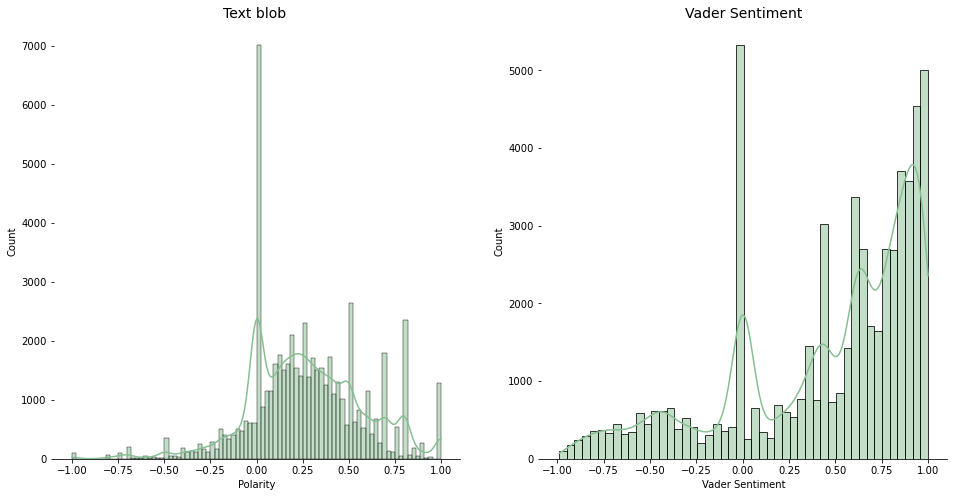

In [56]:
# visualing the overall rating

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
# Plot 1

ax1 = sns.histplot(data=df, x='Polarity', color='#86bf91', kde=True, ax=axes[0])
ax1.set_title('Text blob ', fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)


# Plot 2

ax2 = sns.histplot(data=df, x="Vader Sentiment", color='#86bf91', kde=True, ax=axes[1])
ax2.set_title('Vader Sentiment', fontsize=14)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['left'].set_visible(False)


plt.show()

The following graphs shows a scatter plot between Text blob Polarity score and Vader sentiment compound score. The main aim of this graph is to observe correlation between two sentiment scores. We can see that Vader sentiment analyzer has high positive compound score for different lower positive values of text blob sentiment analyzer.

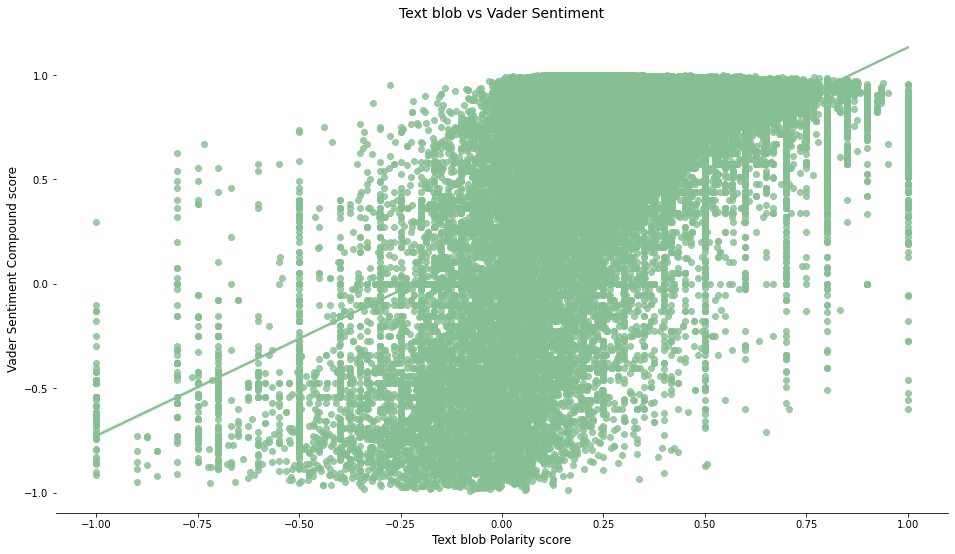

In [57]:
ax1 = sns.regplot(x=df["Polarity"], y=df["Vader Sentiment"], color = "#86bf91")
ax1.set_title('Text blob vs Vader Sentiment', fontsize=14)
ax1.set_xlabel('Text blob Polarity score', fontsize=12)
ax1.set_ylabel('Vader Sentiment Compound score' , fontsize=12)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)
plt.show()

## Task 6: Naive Bayes Classifier

- ### Subtask 6.1 Text preprocessing 

In the following section I evaluate the sentiment from three different methods. Thus, for this purpose I have created another data frame which contains information about lemmatized and processed reviews and sentiments from rating, text blob and Vader. At the end of this section I will prepare my data for the Naive bayes classifier analysis.

In [58]:
# creating a new dataframe for the lemmatized reviews, rating sentiment, text blob and vader sentiment
df_analysis = pd.DataFrame()
df_analysis['review'] = df['lemma']

df_analysis['rating_sentiment'] = df['rating_sentiment']
df_analysis['textblb_sentiment'] = df['Analysis']
df_analysis['vader_sentiment'] = df['Vader_Analysis']

df_analysis.head(3)

,review,rating_sentiment,textblb_sentiment,vader_sentiment
14,buy service,Negative,Neutral,Neutral
15,nextel nearly year start time last year moto...,Positive,Positive,Positive
16,get say easy use hear person talk fine probl...,Positive,Positive,Neutral


In [59]:
# function to preprocess text. the text is already cleaned, using the following function to make sure the text is ready
stop_words = stopwords.words('english')
def preprocessing_text(text):
    words = word_tokenize(text.lower())
    tokens = [word for word in words if word not in string.punctuation]
    tokens_lematized = [token for token in tokens if token not in  stop_words]
    preprocessed_text = ' '.join(tokens_lematized)
    return preprocessed_text 

df_analysis['review'] = df_analysis['review'].apply(preprocessing_text)


In [60]:
#CountVectorizer will convert text into token counts
bow_transformer = CountVectorizer()
bow_transformer = CountVectorizer().fit(df_analysis['review'])


data_bow = bow_transformer.transform(df_analysis['review'])
tfidf_transformer = TfidfTransformer().fit(data_bow)
# transforming the data
data_tfidf = tfidf_transformer.transform(data_bow)

- ### Subtask 6.2 Naive Bayes  Classifier

This section contains the main analytical and model evaluation. Naive Bayes classifier is one of the most practical machine learning algorithms. It performs very well with text data. It learns and predicts very fast. (Naive Bayes Classifier class notes). Thus, I will use the mentioned algorithm to evaluate the reviews and select one methods for further analysis. 

In the following section first I create models for each sentiment analyzer, aftercreating modeling I find all predictions. As a result I compare each model classification report. 

In [61]:
from sklearn.naive_bayes import MultinomialNB

In [62]:
# creating models for rating, textblob and vader sentiment analyzers
rating_detect_model = MultinomialNB().fit(data_tfidf.toarray() , df_analysis['rating_sentiment'])

textblb_detect_model = MultinomialNB().fit(data_tfidf.toarray() , df_analysis['textblb_sentiment'])

vader_detect_model = MultinomialNB().fit(data_tfidf.toarray() , df_analysis['vader_sentiment'])

In [63]:
# creating predictions for rating, textblob and vader sentiment analyzers
rating_all_predictions = rating_detect_model.predict(data_tfidf)
textblb_all_predictions = textblb_detect_model.predict(data_tfidf)
vader_all_predictions = vader_detect_model.predict(data_tfidf)

In the following three codes I used classification report to receive Naive Bayes classifier report. The following classification reports show the precision, recall, f1-score, and accuracy score for each model which are rating, text blob and Vader sentiment. The definition for each is as following:
- Precision is defined as the ratio of true positives to the sum of true and false positives.
- Recall is defined as the ratio of true positives to the sum of true positives and false negatives.
- The F1 is the weighted harmonic mean of precision and recall. The closer the value of the F1 score is to 1.0, the better the expected performance of the model is
- Support is the number of actual occurrences of the class in the dataset. It doesn’t vary between models, it just diagnoses the performance evaluation process.
The source for the definitions can be found [here](https://thecleverprogrammer.com/2021/07/07/classification-report-in-machine-learning/#:~:text=Precision%20is%20defined%20as%20the,of%20true%20and%20false%20positives.&text=Recall%20is%20defined%20as%20the,true%20positives%20and%20false%20negatives.&text=The%20F1%20is%20the%20weighted%20harmonic%20mean%20of%20precision%20and%20recall.). 

From the following result we can see that rating sentiment model has the highest accuracy, however I cannot choose this model because it is not based on the review text. In this model we can see that negative sentiment precision is 0.91, however we do not have any information about Neutral sentiment reviews. On the other hand Positive text sentiment is precision is 0.76. 

Text blob model indicates an accuracy of 0.78. The precision shows that the ratio of true positive to the sum of true and false positives, for negative sentiment is 1.00, for neutral is 0.99 and for the positive sentiment is 0.77 which is the highest among all models. 

We can see that Vader sentiment shows an accuracy of 0.68 which is the lowest among all models. the precision of negative sentiment is 1.00,neutral is 0.78 and positive precision is 0.67 which is the lowest among other models. 

As a result we can say that negative sentiment has overall higher precision across all model, however neutral sentiment has the lowest precision compared to positive and negative sentiments across models. 

We can see that f1-socre which shows the mean value of precision and recall for negative sentiment rating score has the highest value of 0.63, for the positive sentiment text blob has the highest values, and for the neutral sentiment Vader has the highest value. It can be said that each of these sentiments has the highest _support_ wherever their f1-score is high, thus the more observation the better f1-score.

As a result of this analysis I choose text blob for further visualization.


In [64]:
from sklearn.metrics import classification_report
# printing the classification report of rating sentiment 
print (classification_report(df_analysis['rating_sentiment'], rating_all_predictions))

              precision    recall  f1-score   support

    Negative       0.91      0.48      0.63     15532
     Neutral       0.00      0.00      0.00      4428
    Positive       0.76      0.99      0.86     38299

    accuracy                           0.78     58259
   macro avg       0.56      0.49      0.50     58259
weighted avg       0.74      0.78      0.74     58259



In [65]:
# printing the classification report of textblob sentiment
print (classification_report(df_analysis['textblb_sentiment'], textblb_all_predictions))

              precision    recall  f1-score   support

    Negative       1.00      0.01      0.02      7127
     Neutral       0.97      0.01      0.02      6312
    Positive       0.77      1.00      0.87     44820

    accuracy                           0.77     58259
   macro avg       0.91      0.34      0.30     58259
weighted avg       0.82      0.77      0.67     58259



In [66]:
# printing the classification report of vader sentiment
print (classification_report(df_analysis['vader_sentiment'], vader_all_predictions))

              precision    recall  f1-score   support

    Negative       1.00      0.00      0.00      3824
     Neutral       0.78      0.29      0.42     20502
    Positive       0.67      1.00      0.80     33933

    accuracy                           0.68     58259
   macro avg       0.82      0.43      0.41     58259
weighted avg       0.73      0.68      0.61     58259



I will choose the Text blob Sentiment analysis for trains and test datasets. Thus, for the purpose of this based on the result from above, I prefer Text blob sentiment.  

In [67]:
# spliting the data into train and test sets
from sklearn.model_selection import train_test_split
review_train, review_test, label_train, label_test = train_test_split(df_analysis['review'], 
                                                                      df_analysis['textblb_sentiment'], 
                                                                      test_size=0.3, random_state=1)



In [68]:
# creating a pipeline
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer


#create pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),  # integer counts to weighted TF-IDF scores
    ('classifier', MultinomialNB()),  #Naive Bayes classifier
])

In [69]:
#Now we can directly pass message text data and the pipeline will do our pre-processing for us!
pipeline.fit(review_train, label_train)
predictions = pipeline.predict(review_test)

The following code shows the classification report, I divided the dataset in to test and train sets. where the the test size is 30% of the observations and data is selected randomly. The accuracy of the model is 0.77 and negative and neutral has the precision of 1.00 and positive sentiment has precision of 0.77.

In [70]:
print (classification_report(label_test,  predictions))

              precision    recall  f1-score   support

    Negative       1.00      0.00      0.00      2151
     Neutral       1.00      0.00      0.01      1878
    Positive       0.77      1.00      0.87     13449

    accuracy                           0.77     17478
   macro avg       0.92      0.34      0.29     17478
weighted avg       0.82      0.77      0.67     17478



## Task 6: Result Analysis and Visualization

The following graph shows text blob polarity score based on the rating we can see that average polarity score across different rating is increasing. Which shows that higher rating on average have higher polarity score which proofs the hypothesis. 

Text(0.5, 0, 'Rating')

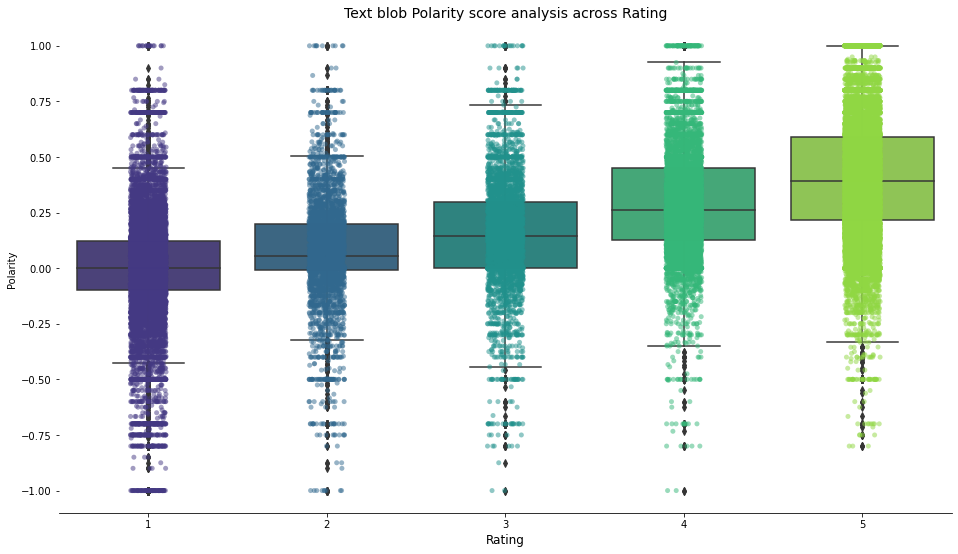

In [71]:
# Vader sentiment score based on the rating
ax = sns.boxplot(x = "rating",
            y = "Polarity",
            data = df, palette='viridis')
ax = sns.stripplot(x = "rating",
              y = "Polarity",
              data = df, palette='viridis', alpha = 0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_title('Text blob Polarity score analysis across Rating', fontsize=14)
ax.set_xlabel('Rating', fontsize=12)


Text blob polarity score analysis indicates a similar daily average and number of reviews

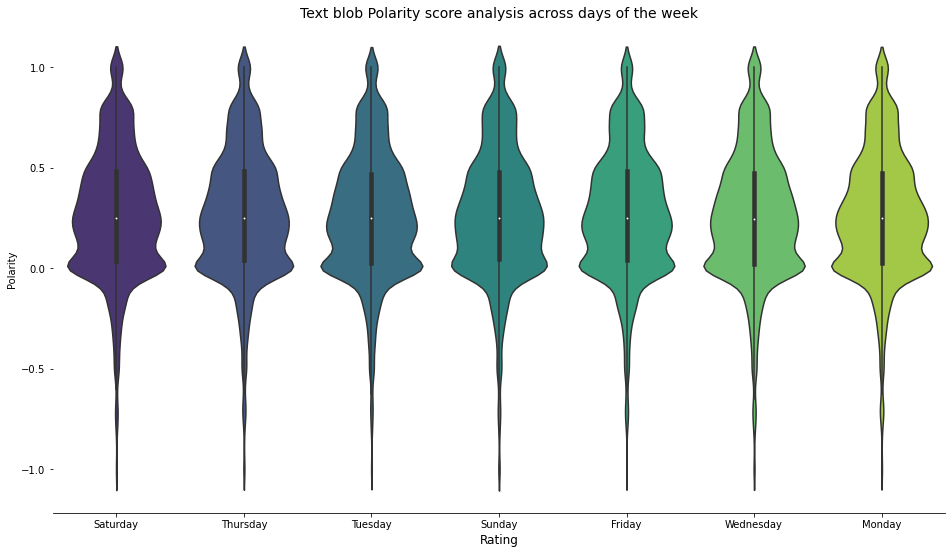

In [72]:
ax = sns.violinplot(x="weekday", y="Polarity", data=df, palette="viridis", alpha = 0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_title('Text blob Polarity score analysis across days of the week', fontsize=14)
ax.set_xlabel('Rating', fontsize=12)
plt.show()

The following boxplot shows the average polarity score and number of observations across different brands. We can see that Samsung has the highest number of reviews

In [73]:
#!pip install altair_catplot
import altair as alt
import altair_catplot as altcat
altcat.catplot(df.sample(n = 5000),
               height=350,
               width=950,
               mark='point',
               box_mark=dict(strokeWidth=2, opacity=0.6),
               whisker_mark=dict(strokeWidth=2, opacity=0.9),
               encoding=dict(x=alt.X('brand:N', title=None),
                             y=alt.Y('Polarity:Q',scale=alt.Scale(zero=False)),
                             color=alt.Color('brand:N', legend=None, scale=alt.Scale(scheme='viridis'))),
               transform='jitterbox',
              jitter_width=0.5)

/Users/ghazalayobi/opt/anaconda3/lib/python3.9/site-packages/altair_catplot/jitter.py:154: UserWarning: Categorical axis titles not allowed for jitter plots. Ignoring....
  warnings.warn(
/Users/ghazalayobi/opt/anaconda3/lib/python3.9/site-packages/altair_catplot/jitterbox.py:162: UserWarning: Categorical axis titles not allowed for jitter-box plots. Ignoring....
  warnings.warn(


alt.LayerChart(...)

In the following code I have use monograms to find what are the top 25 words based on the text blob polarity score.  We can see that the positive sentiment has highest frequency of words which is _phone_ which is clear the second most used word is _good_ indicating a positive review. Neutral has the least number of frequencies, we can see that the most used word is _unlocked_. On the other hand, negative sentiment indicates interesting result that many negative sentiments contain _battery_ indicating the phones most common problem to be the battery. For this analysis, I have used the cleaned reviews which also contains stopwords, the purpose is to better understand the ngrams and bi grams. 

In [80]:
#Filtering data
from collections import defaultdict
from nltk.corpus import stopwords
stopwords = set(stopwords.words("english"))
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot

df['review_len'] = df['review'].astype(str).apply(len)
df['word_count'] = df['review'].apply(lambda x: len(str(x).split()))

review_pos = df[df["Analysis"]=='Positive'].dropna()
review_neu = df[df["Analysis"]=='Neutral'].dropna()
review_neg = df[df["Analysis"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in stopwords]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, plot_bgcolor='rgba(0,0,0,0)', width=900, title="Word Count Plots")
iplot(fig, filename='word-plots')

The following graph shows the result of bi-grams from the review text, We can an interesting result that battery life is the highest in positive and negative sentiments. It indicates the importance of battery life for customers.

In [81]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')



# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1200, width=900, plot_bgcolor='rgba(0,0,0,0)', title="Bigram Plots")
iplot(fig, filename='word-plots')

The following graph shows the result from tr-grams. We can see the most common phrase for the positive reviews are _best phone ever_ indicating the satisfaction of customer. On the other hand, in the negative sentiment the most common phrase is _worst phone ever_ indicating unhappy customers. We can see that customers most common problems are battery life.

In [76]:
## Get the bar chart from positive reviews ##
for sent in review_pos["review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), '#86bf91')




# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews", 
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1000, plot_bgcolor='rgba(0,0,0,0)' , title="Trigram Count Plots")
iplot(fig, filename='word-plots')

The source for codes of above graphs can be found in refenreces 

In the following section I use lemmatized words to see the most common words in each sentiment. The interesting result from positive sentiment is _Nextel is one of the most common words used in the positive reviews. Nextel is a an American wireless service operator.

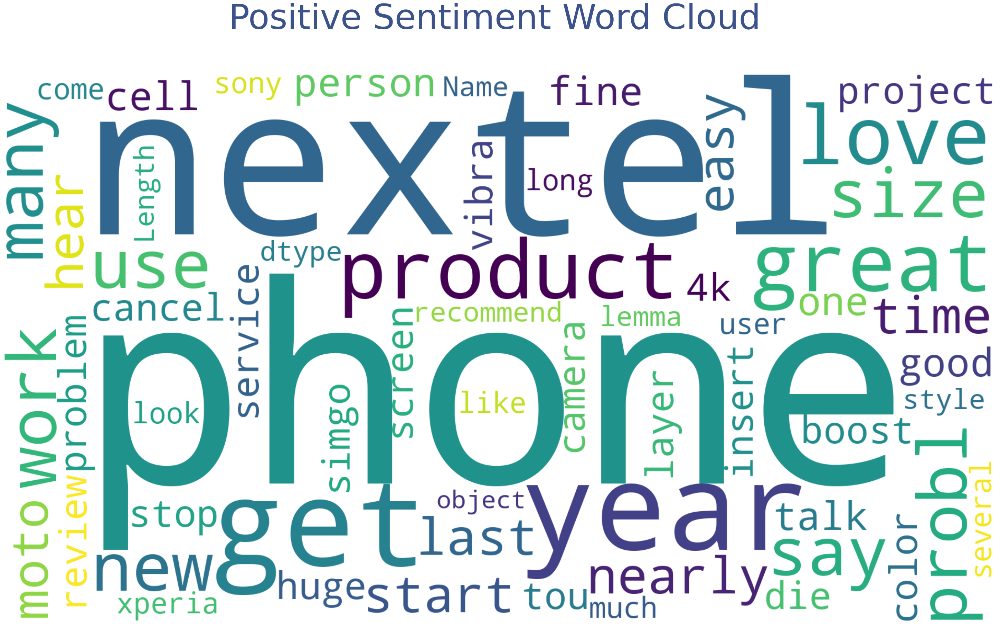

In [77]:
text = review_pos["lemma"]
wordcloud = WordCloud(
    width = 1800,
    height = 1000,
    background_color = 'white',
    stopwords = stopwords).generate(str(text))
fig = plt.figure(
    figsize = (40, 30))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title(label="Positive Sentiment Word Cloud \n",
          fontsize=100,
          color="#3b528b")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

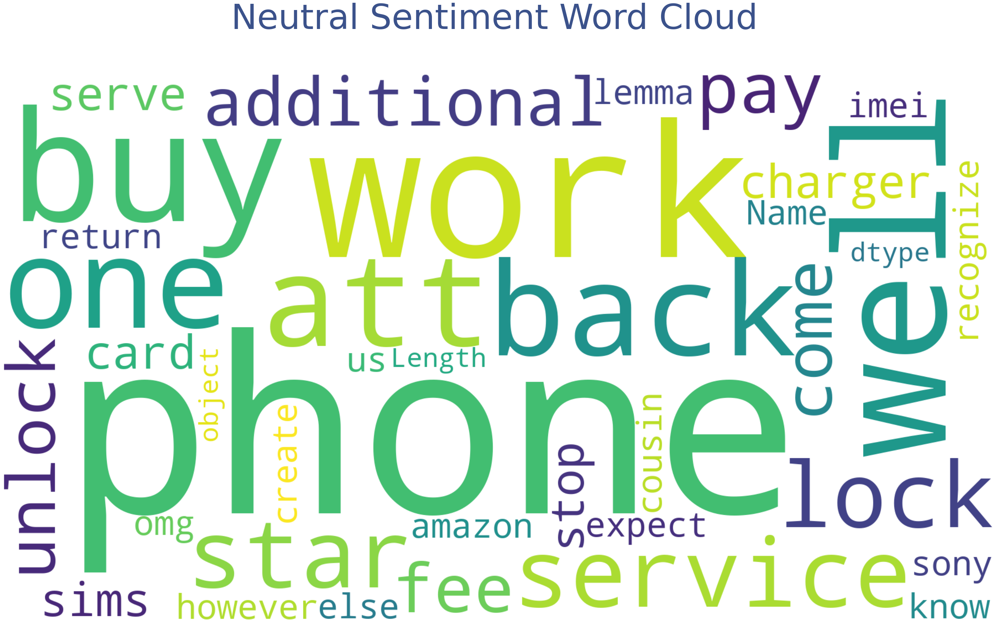

In [78]:
text = review_neu["lemma"]
wordcloud = WordCloud(
    width = 1800,
    height = 1000,
    background_color = 'white',
    stopwords = stopwords).generate(str(text))
fig = plt.figure(
    figsize = (40, 30))

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title(label="Neutral Sentiment Word Cloud \n",
          fontsize=100,
          color="#3b528b")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

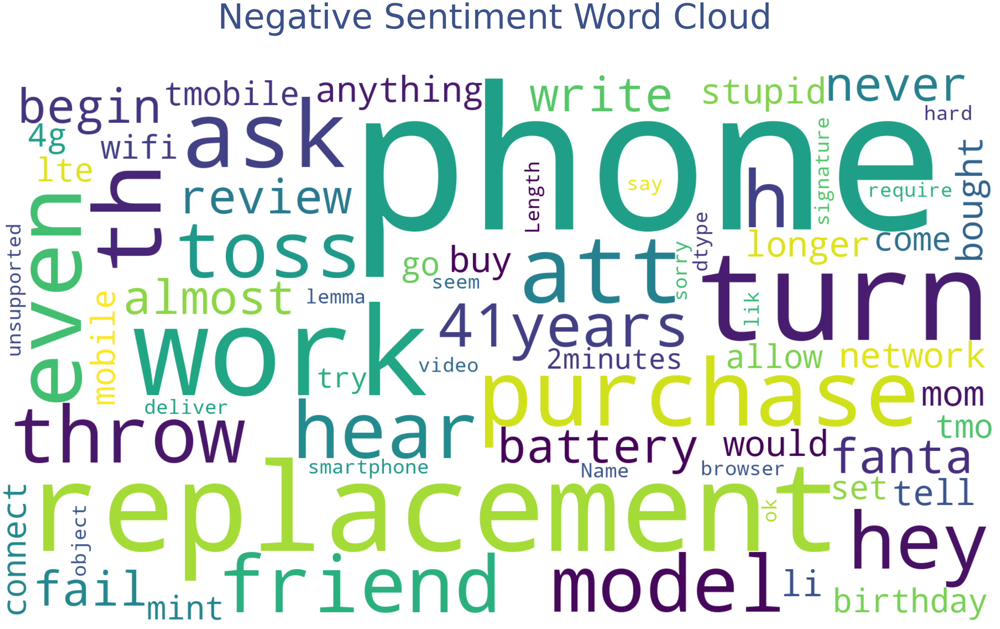

In [79]:
text = review_neg["lemma"]
wordcloud = WordCloud(
    width = 1800,
    height = 1000,
    background_color = 'white',
    stopwords = stopwords).generate(str(text))
fig = plt.figure(
    figsize = (40, 30))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title(label="Negative Sentiment Word Cloud \n",
          fontsize=100,
          color="#3b528b")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Task 7: Conclusion

 - #### Summary
 - #### Algorithm Decision Analysis
 
In the project my main objective was to use different text analysis methods and evaluate the result based on the Naive Byes classifier, As a result I choose Text blob sentiment analyzer because it had the highest accuracy and had, better result in terms of precision, and f1 score. 
 
We have seen that the most common problem of customers indicated from reviews is phones battery life and it is worth mentioning battery life is also source of the customer satisfaction. Thus, we can say phone battery is most significant part.



https://www.kaggle.com/code/temoralkaisi/natural-processing-language/notebook#Apple
https://www.kaggle.com/code/halimedogan/sentiment-analysis-with-nlp-for-amazon-reviews 
https://www.kaggle.com/code/benroshan/sentiment-analysis-amazon-reviews 